<h1>Predict Customer Personality To Boost Marketing Campaign</h1><br>
Mengolah data historical marketing campaign guna menaikkan performa dan menyasar customers yang tepat agar dapat bertransaksi di platform perusahaan.

<h2>Tentang Dataset</h2><br>
<b>Konteks</b><br>
Sebuah perusahaan ingin membuat sebuah model prediksi kluster sehingga memudahkan perusahaan dalam membuat keputusan.
<br><br>
<b>Konten</b><br>
Kumpulan data yang digunakan untuk analisis berisi 2240 observasi dari 30 variabel.<br>
Data berisis informasi:<br><br>

* <br>
* ID
* Year_Birth
* Education
* Marital_Status
* Income
* Kidhome
* Teenhome
* Dt_Customer
* Recency
* MntCoke
* MntFruits
* MntMeatProducts
* MntFishProducts
* MntSweetProducts
* MntGoldProds
* NumDealsPurchases
* NumWebPurchases
* NumCatalogPurchases
* NumStorePurchases
* NumWebVisitsMonth
* AcceptedCmp3
* AcceptedCmp4
* AcceptedCmp5
* AcceptedCmp1
* AcceptedCmp2
* Complain
* Z_CostContact
* Z_Revenue
* Response

<h2>Identifikasi Data</h2><br>
Langkah pertama yang dilakukan adalah mengenali data, menetapkan variabel tergantung (target) dan variabel bebas (independen), serta memeriksa apakah dalam data tersebut sudah bersih atau masih terdapat data yang hilang.

In [1]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Membaca data
data = pd.read_csv('marketing_campaign_data.csv')
data.head()

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,0,5524,1957,S1,Lajang,58138000.0,0,0,04-09-2012,58,...,7,0,0,0,0,0,0,3,11,1
1,1,2174,1954,S1,Lajang,46344000.0,1,1,08-03-2014,38,...,5,0,0,0,0,0,0,3,11,0
2,2,4141,1965,S1,Bertunangan,71613000.0,0,0,21-08-2013,26,...,4,0,0,0,0,0,0,3,11,0
3,3,6182,1984,S1,Bertunangan,26646000.0,1,0,10-02-2014,26,...,6,0,0,0,0,0,0,3,11,0
4,4,5324,1981,S3,Menikah,58293000.0,1,0,19-01-2014,94,...,5,0,0,0,0,0,0,3,11,0


In [3]:
#Menampilkan informasi tipe data setiap kolom
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           2240 non-null   int64  
 1   ID                   2240 non-null   int64  
 2   Year_Birth           2240 non-null   int64  
 3   Education            2240 non-null   object 
 4   Marital_Status       2240 non-null   object 
 5   Income               2216 non-null   float64
 6   Kidhome              2240 non-null   int64  
 7   Teenhome             2240 non-null   int64  
 8   Dt_Customer          2240 non-null   object 
 9   Recency              2240 non-null   int64  
 10  MntCoke              2240 non-null   int64  
 11  MntFruits            2240 non-null   int64  
 12  MntMeatProducts      2240 non-null   int64  
 13  MntFishProducts      2240 non-null   int64  
 14  MntSweetProducts     2240 non-null   int64  
 15  MntGoldProds         2240 non-null   i

In [4]:
#Mendeteksi baris yang kosong
data.isna().sum()

Unnamed: 0              0
ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntCoke                 0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [5]:
data = data.dropna()
print("\nDataFrame setelah menghapus baris dengan nilai kosong:")
print(data)


DataFrame setelah menghapus baris dengan nilai kosong:
      Unnamed: 0     ID  Year_Birth Education Marital_Status      Income  \
0              0   5524        1957        S1         Lajang  58138000.0   
1              1   2174        1954        S1         Lajang  46344000.0   
2              2   4141        1965        S1    Bertunangan  71613000.0   
3              3   6182        1984        S1    Bertunangan  26646000.0   
4              4   5324        1981        S3        Menikah  58293000.0   
...          ...    ...         ...       ...            ...         ...   
2235        2235  10870        1967        S1        Menikah  61223000.0   
2236        2236   4001        1946        S3    Bertunangan  64014000.0   
2237        2237   7270        1981        S1          Cerai  56981000.0   
2238        2238   8235        1956        S2    Bertunangan  69245000.0   
2239        2239   9405        1954        S3        Menikah  52869000.0   

      Kidhome  Teenhome Dt_Cust

In [6]:
data.isna().sum()

Unnamed: 0             0
ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntCoke                0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

In [7]:
#Mendeteksi duplikasi baris
data[data.duplicated()]

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response


In [8]:
data.duplicated().sum()

0

Setelah data diperiksa, ada beberapa temuan yang didapatkan antaranya sebagai berikut:
1. <b>Variabel Dependen</b> dari data tersebut adalah <b>Response</b> dimana luaran dari kolom tersebut adalah 1 untuk tepat sasaran dan 0 untuk tidak tepat sasaran
2. <b>Variabel Independen</b> dari data tersebut adalah Year_Birth, Education, Marital_Status, Income, Kidhome, Teenhome, Dt_Customer, Recency, MntCoke, MntFruits, MntMeatProducts, MntFishProducts, MntSweetProducts, MntGoldProds, NumDealsPurchases, NumWebPurchases, NumCatalogPurchases, NumStorePurchases, NumWebVisitsMonth, AcceptedCmp3, AcceptedCmp4, AcceptedCmp5, AcceptedCmp1, AcceptedCmp2, Complain, Z_CostContact, Z_Revenue
3. Kolom 0 dan id tidak termasu variabel idependen karena hanya melabelkan identitas pelanggan, tidak mempengaruhi terhadap marketing campaign
4. Tipe masing-masing kolom sudah sesuai
5. Ditemukan baris kosong pada kolom Income sebanyak 24, bari kosong akan di drop karena jumlahnya tidak melebihin 40% data observasi
6. Tidak ditemukan data duplikat

<h2>Mendeskripsikan & Mengelompokkan Data</h2><br>
Fungsi mendeskripsikan dan mengelompokkan data sangat krusial dalam analisis data, khususnya dalam konteks pengambilan keputusan yang didasarkan pada data. Tujuannya adalah untuk memberikan wawasan umum mengenai data yang ada, termasuk seberapa besar variasi, distribusi, dan pola yang terlihat. Selain itu, juga untuk memisahkan data ke dalam beberapa kategori sehingga setiap kategori memiliki ciri atau karakteristik yang serupa.

In [9]:
#Mendeskripsikan setiap kolom data
round(data.describe(), 2)

,Unnamed: 0,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntCoke,MntFruits,MntMeatProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2216.00,2216.00,2216.00,2.216000e+03,2216.00,2216.00,2216.00,2216.00,2216.00,2216.00,...,2216.00,2216.00,2216.00,2216.00,2216.00,2216.00,2216.00,2216.0,2216.0,2216.00
mean,1121.87,5588.35,1968.82,5.224725e+07,0.44,0.51,49.01,305091.61,26356.05,166995.94,...,5.32,0.07,0.07,0.07,0.06,0.01,0.01,3.0,11.0,0.15
std,643.16,3249.38,11.99,2.517308e+07,0.54,0.54,28.95,337327.92,39793.92,224283.27,...,2.43,0.26,0.26,0.26,0.24,0.12,0.10,0.0,0.0,0.36
min,0.00,0.00,1893.00,1.730000e+06,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.0,11.0,0.00
25%,566.75,2814.75,1959.00,3.530300e+07,0.00,0.00,24.00,24000.00,2000.00,16000.00,...,3.00,0.00,0.00,0.00,0.00,0.00,0.00,3.0,11.0,0.00
50%,1120.50,5458.50,1970.00,5.138150e+07,0.00,0.00,49.00,174500.00,8000.00,68000.00,...,6.00,0.00,0.00,0.00,0.00,0.00,0.00,3.0,11.0,0.00
75%,1678.25,8421.75,1977.00,6.852200e+07,1.00,1.00,74.00,505000.00,33000.00,232250.00,...,7.00,0.00,0.00,0.00,0.00,0.00,0.00,3.0,11.0,0.00
max,2239.00,11191.00,1996.00,6.666660e+08,2.00,2.00,99.00,1493000.00,199000.00,1725000.00,...,20.00,1.00,1.00,1.00,1.00,1.00,1.00,3.0,11.0,1.00


In [10]:
# Pisahkan kolom berdasarkan tipe data
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()
numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns.tolist()

In [11]:
#Mendeskripsikan data kategori
data[categorical_cols].describe(include='all')

,Education,Marital_Status,Dt_Customer
count,2216,2216,2216
unique,5,6,662
top,S1,Menikah,31-08-2012
freq,1116,857,12


In [12]:
#Mendeskripsikan data kategori berdasarkan tiap kolom
for col in categorical_cols:
    print(f'''Value count kolom {col}:''')
    print(data[col].value_counts())
    print()

Value count kolom Education:
Education
S1     1116
S3      481
S2      365
D3      200
SMA      54
Name: count, dtype: int64

Value count kolom Marital_Status:
Marital_Status
Menikah        857
Bertunangan    573
Lajang         475
Cerai          232
Janda           76
Duda             3
Name: count, dtype: int64

Value count kolom Dt_Customer:
Dt_Customer
31-08-2012    12
12-09-2012    11
14-02-2013    11
12-05-2014    11
20-08-2013    10
              ..
05-08-2012     1
18-11-2012     1
09-05-2014     1
26-06-2013     1
09-01-2014     1
Name: count, Length: 662, dtype: int64



Mendeskripsikan data berdasarkan kategori, didapatkan bahwa:
1. Jumlah customer pada perusahaan ini berjumlah 2240
2. Kolom Education berisikan 5 kategori yang di dominasi oleh <b>S1</b> dengan jumlah 1127
3. Kolom Marital_Status didominasi dengan status <b>Menikah</b> sebanyak 864

In [13]:
#Mendeskripsikan data numerik
data[numeric_cols].describe()

,Unnamed: 0,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntCoke,MntFruits,MntMeatProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2216.000000,2216.000000,2216.000000,2.216000e+03,2216.000000,2216.000000,2216.000000,2.216000e+03,2216.000000,2.216000e+03,...,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.0,2216.0,2216.000000
mean,1121.867329,5588.353339,1968.820397,5.224725e+07,0.441787,0.505415,49.012635,3.050916e+05,26356.046931,1.669959e+05,...,5.319043,0.073556,0.074007,0.073105,0.064079,0.013538,0.009477,3.0,11.0,0.150271
std,643.164161,3249.376275,11.985554,2.517308e+07,0.536896,0.544181,28.948352,3.373279e+05,39793.916518,2.242833e+05,...,2.425359,0.261106,0.261842,0.260367,0.244950,0.115588,0.096907,0.0,0.0,0.357417
min,0.000000,0.000000,1893.000000,1.730000e+06,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,566.750000,2814.750000,1959.000000,3.530300e+07,0.000000,0.000000,24.000000,2.400000e+04,2000.000000,1.600000e+04,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,1120.500000,5458.500000,1970.000000,5.138150e+07,0.000000,0.000000,49.000000,1.745000e+05,8000.000000,6.800000e+04,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,1678.250000,8421.750000,1977.000000,6.852200e+07,1.000000,1.000000,74.000000,5.050000e+05,33000.000000,2.322500e+05,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,2239.000000,11191.000000,1996.000000,6.666660e+08,2.000000,2.000000,99.000000,1.493000e+06,199000.000000,1.725000e+06,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


Hasil dari deskripsi data <b>numerikal</b>, didapatkan bahwa:

1. Rata-rata <b>Income</b> adalah 5,224,725
2. Rata-rata <b>NumWebVisitMonth</b> adalah 5x dan paling banyak 20x

<h3>Menambahkan Kolom Baru</h3>

<h4>1. Kolom Age</h4>

In [14]:
from datetime import datetime

# Membuat kolom Age
data['Age'] = 2024 - data['Year_Birth']  # Misalnya tahun saat ini adalah 2024

# Membuat kolom Age Group
bins = [0, 25, 35, 50, float('inf')]
labels = ['<25', '25-35', '36-50', '>50']
data['Age_Group'] = pd.cut(data['Age'], bins=bins, labels=labels)

# Lihat hasil
print(data[['Year_Birth', 'Age', 'Age_Group']].head())

   Year_Birth  Age Age_Group
0        1957   67       >50
1        1954   70       >50
2        1965   59       >50
3        1984   40     36-50
4        1981   43     36-50


<h4>2. Kolom Total Spending</h4>

In [15]:
# Membuat kolom Total_Spending
data['Total_Spending'] = (
    data['MntCoke'] + 
    data['MntFruits'] + 
    data['MntMeatProducts'] + 
    data['MntFishProducts'] + 
    data['MntSweetProducts'] + 
    data['MntGoldProds']
)

# Melihat hasil (5 baris pertama)
print(data[['MntCoke', 'MntFruits', 'MntMeatProducts', 
            'MntFishProducts', 'MntSweetProducts', 
            'MntGoldProds', 'Total_Spending']].head())

   MntCoke  MntFruits  MntMeatProducts  MntFishProducts  MntSweetProducts  \
0   635000      88000           546000           172000             88000   
1    11000       1000             6000             2000              1000   
2   426000      49000           127000           111000             21000   
3    11000       4000            20000            10000              3000   
4   173000      43000           118000            46000             27000   

   MntGoldProds  Total_Spending  
0         88000         1617000  
1          6000           27000  
2         42000          776000  
3          5000           53000  
4         15000          422000  


<h4>3. Kolom Jumlah Anak</h4>

In [16]:
# Membuat kolom Jumlah_Anak
data['Jumlah_Anak'] = (data['Kidhome'] + data['Teenhome'] > 0).astype(int)

# Melihat hasil (5 baris pertama)
print(data[['Kidhome', 'Teenhome', 'Jumlah_Anak']].head())

   Kidhome  Teenhome  Jumlah_Anak
0        0         0            0
1        1         1            1
2        0         0            0
3        1         0            1
4        1         0            1


<h4>4. Kolom Convension Rate</h4>

In [17]:
# Membuat kolom Conversion_Rate
data['Conversion_Rate'] = data['Response'] / data['NumWebVisitsMonth']

# Melihat hasil (5 baris pertama)
print(data[['Response', 'NumWebVisitsMonth', 'Conversion_Rate']].head())

   Response  NumWebVisitsMonth  Conversion_Rate
0         1                  7         0.142857
1         0                  5         0.000000
2         0                  4         0.000000
3         0                  6         0.000000
4         0                  5         0.000000


<h4>5. Kolom Total Respon</h4>

In [18]:
#Menjumlahkan kolom respons dari kampanye pemasaran
data['Total_Respons'] = (
    data['AcceptedCmp1'] +
    data['AcceptedCmp2'] +
    data['AcceptedCmp3'] +
    data['AcceptedCmp4'] +
    data['AcceptedCmp5']
)

# Melihat hasil (5 baris pertama)
print(data[['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Total_Respons']].head())

   AcceptedCmp1  AcceptedCmp2  AcceptedCmp3  AcceptedCmp4  AcceptedCmp5  \
0             0             0             0             0             0   
1             0             0             0             0             0   
2             0             0             0             0             0   
3             0             0             0             0             0   
4             0             0             0             0             0   

   Total_Respons  
0              0  
1              0  
2              0  
3              0  
4              0  


<h3>6. Kolom Kunjungan Ke Website</h3>

In [19]:
# Membuat rata-rata kunjungan ke website per bulan
data['avg_web_visits'] = data['NumWebVisitsMonth'] / 12

print(data['avg_web_visits'])

0       0.583333
1       0.416667
2       0.333333
3       0.500000
4       0.416667
          ...   
2235    0.416667
2236    0.583333
2237    0.500000
2238    0.250000
2239    0.583333
Name: avg_web_visits, Length: 2216, dtype: float64


<h3>7. Kolom Pembelian</h3>

In [20]:
# Membuat rasio dari pembelian online terdahap total pembelian
data['online_purchase_ratio'] = data['NumWebPurchases'] / (data['NumWebPurchases'] + data['NumCatalogPurchases'] + data['NumStorePurchases'])

print(data['online_purchase_ratio'])

0       0.363636
1       0.250000
2       0.400000
3       0.333333
4       0.357143
          ...   
2235    0.562500
2236    0.533333
2237    0.111111
2238    0.285714
2239    0.375000
Name: online_purchase_ratio, Length: 2216, dtype: float64


<h2>Analisis Data</h2><br>
Analisis Data dilakukan dengan melakukan pendekatan grafik. Analisis yang dilakukan terbagi menjadi 2, yaitu:

1. Analisis Univariasi dianalisis dengan 3 jenis plot, yaitu:<br>
    a. <b>Violin Plot</b> untuk mengevaluasi apakah setiap variabel memiliki data pencilan (outlier) atau tidak.<br>
    b. <b>Bar Plot</b> untuk melihat distribusi setiap variabel independen berdasarkan variabel tergantung, apakah kampanye pemasaran berjalan sesuai sasaran atau tidak.<br>
    c. <b>Density Plot</b> untuk mengamati distribusi data dan menentukan apakah data tersebut normal atau tidak.

2. Analisis Multivariasi dianalisis dengan 2 jenis plot, yaitu:<br>
    a. <b>Heatmap</b> untuk memberikan representasi visual dari hubungan antar berbagai variabel.<br>
    b. <b>Pair Plot</b> untuk memberikan gambaran menyeluruh tentang keterkaitan antar variabel dalam dataset.<br>

In [21]:
import math
import matplotlib.pyplot as plt
import seaborn as sns

<h3>Analisis Univariasi</h3>

<Figure size 5400x1500 with 0 Axes>

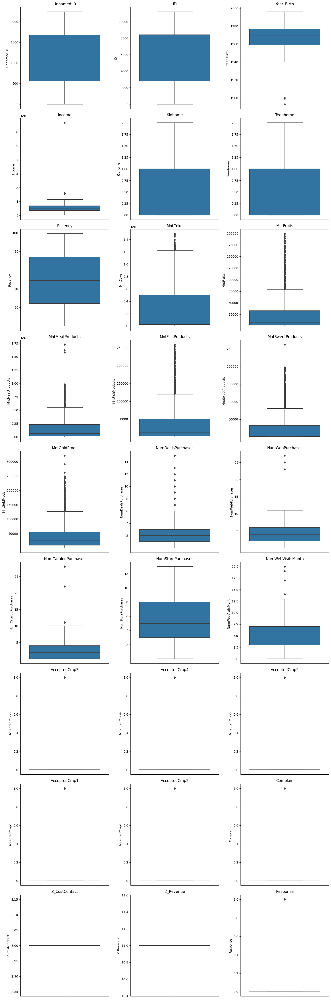

In [22]:
# Univariate Analysis menggunakan boxplot

plt.figure(figsize=(len(numeric_cols) * 2, 15))  # Sesuaikan ukuran gambar
num_rows = math.ceil(len(numeric_cols) / 3)  # Hitung jumlah baris berdasarkan 3 kolom
plt.figure(figsize=(15, num_rows * 5))  # Ukuran gambar yang diperbesar

for i in range(len(numeric_cols)):
    plt.subplot(num_rows, 3, i + 1)  # Mengatur 3 kolom dan menyesuaikan baris
    sns.boxplot(y=data[numeric_cols[i]], orient='v')
    plt.title(numeric_cols[i])  # Menambahkan judul untuk setiap subplot
    plt.tight_layout()  # Mengatur layout agar tidak tumpang tindih

plt.show()  # Menampilkan plot

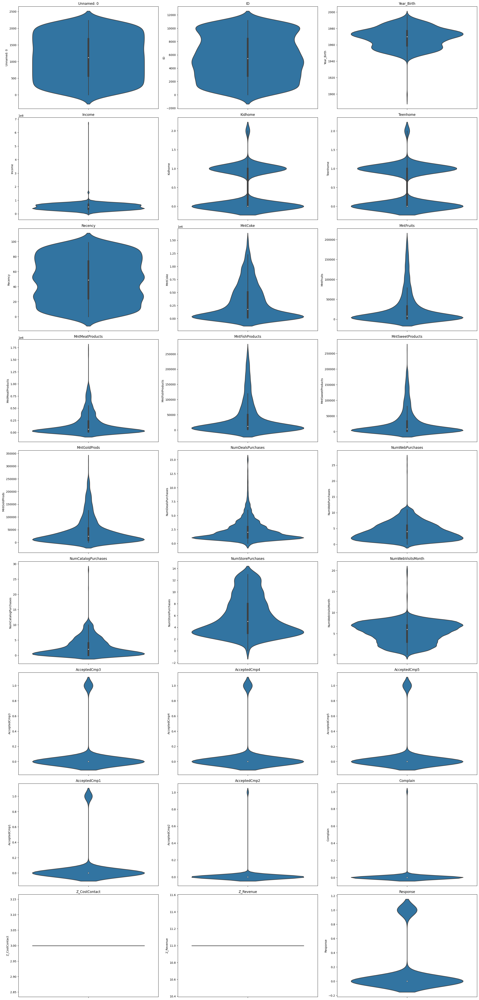

In [23]:
# Univariate Analysis menggunakan Violin Plot

plt.figure(figsize=(24, 50))  # Ukuran gambar yang diperbesar
num_rows = math.ceil(len(numeric_cols) / 3)  # Hitung jumlah baris berdasarkan 3 kolom

for i in range(len(numeric_cols)):
    plt.subplot(num_rows, 3, i + 1)  # Mengatur 3 kolom dan baris yang sesuai
    sns.violinplot(y=data[numeric_cols[i]], linewidth=2, orient='v')  # Menggunakan violin plot tanpa x
    plt.title(numeric_cols[i])  # Menambahkan judul untuk setiap subplot
    plt.ylabel(numeric_cols[i])  # Menambahkan label sumbu y

plt.tight_layout()  # Mengatur layout agar tidak tumpang tindih
plt.show()  # Menampilkan plot

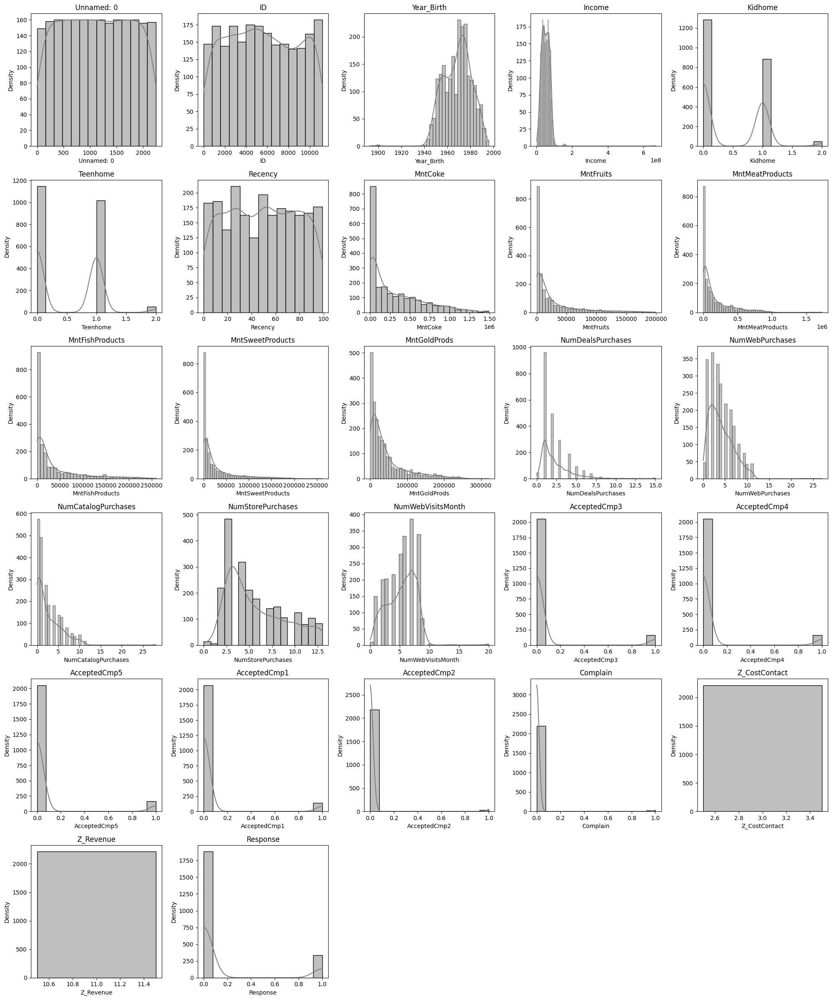

In [24]:
#Unvariat Analysis dengan Density Plot

num_rows = (len(numeric_cols) + 4) // 5  

plt.figure(figsize=(20, num_rows * 4))  # Menyesuaikan ukuran gambar
for i in range(len(numeric_cols)):
    plt.subplot(num_rows, 5, i + 1)
    sns.histplot(data[numeric_cols[i]], kde=True, color='gray')  # Menggunakan histplot dengan kde
    plt.title(numeric_cols[i])  # Menambahkan judul untuk setiap subplot
    plt.xlabel(numeric_cols[i])  # Menambahkan label sumbu x
    plt.ylabel('Density')  # Menambahkan label sumbu y
plt.tight_layout()
plt.show() 

Berdasarkan violin plot, boxplot dan density diatas, didapatkan beberapa analisis sebagai berikut:<br>

* Beberapa variabel menunjukkan variasi yang sangat besar (misalnya, variabel dengan adanya pencilan yang jauh), sementara yang lain memiliki variasi yang lebih kecil.
* Beberapa variabel memiliki distribusi yang lebih seimbang (misalnya, box plot yang hampir sama panjang di atas dan di bawah median), sedangkan yang lainnya memiliki distribusi yang tidak simetris (miring).
* Beberapa variabel memiliki banyak pencilan, yang menunjukkan adanya data yang sangat berbeda dari data lainnya.

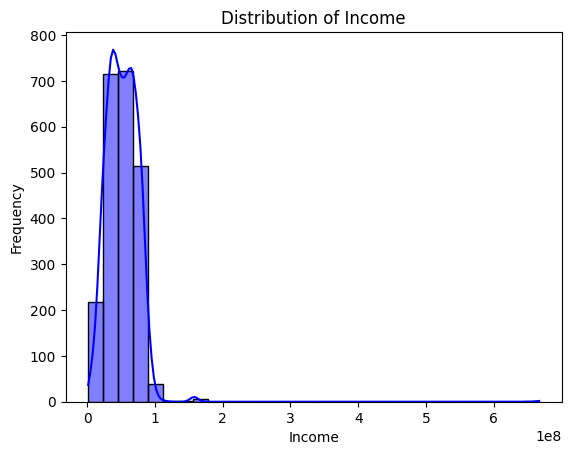

In [25]:
# Distribution of Income

sns.histplot(data['Income'], kde=True, bins=30, color='blue')
plt.title('Distribution of Income')
plt.xlabel('Income')
plt.ylabel('Frequency')
plt.show()

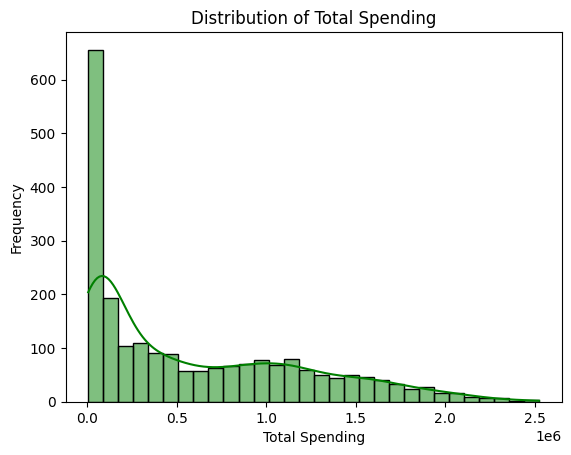

In [26]:
# Distribution of Total Spending

sns.histplot(data['Total_Spending'], kde=True, bins=30, color='green')
plt.title('Distribution of Total Spending')
plt.xlabel('Total Spending')
plt.ylabel('Frequency')
plt.show()

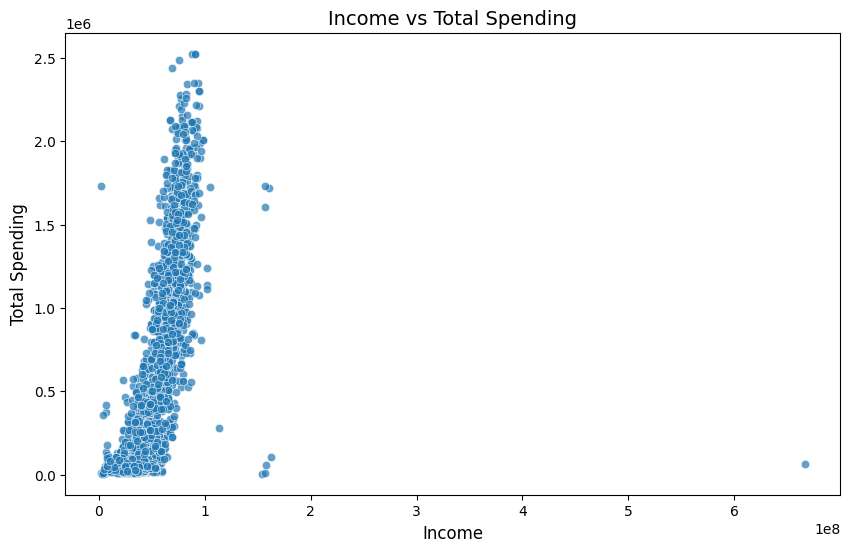

In [27]:
# Scatter plot: Income vs Total Spending

plt.figure(figsize=(10, 6))
sns.scatterplot(x=data['Income'], y=data['Total_Spending'], alpha=0.7)
plt.title('Income vs Total Spending', fontsize=14)
plt.xlabel('Income', fontsize=12)
plt.ylabel('Total Spending', fontsize=12)
plt.show()

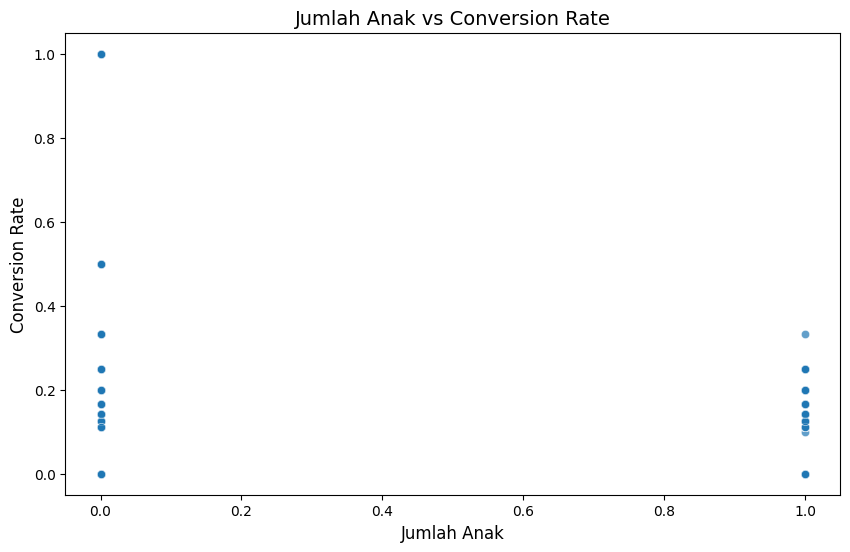

In [28]:
# Membuat scatter plot untuk melihat hubungan antara Jumlah Anak dan Conversion Rate

plt.figure(figsize=(10, 6))
sns.scatterplot(x=data['Jumlah_Anak'], y=data['Conversion_Rate'], alpha=0.7)
plt.title('Jumlah Anak vs Conversion Rate', fontsize=14)
plt.xlabel('Jumlah Anak', fontsize=12)
plt.ylabel('Conversion Rate', fontsize=12)
plt.show()

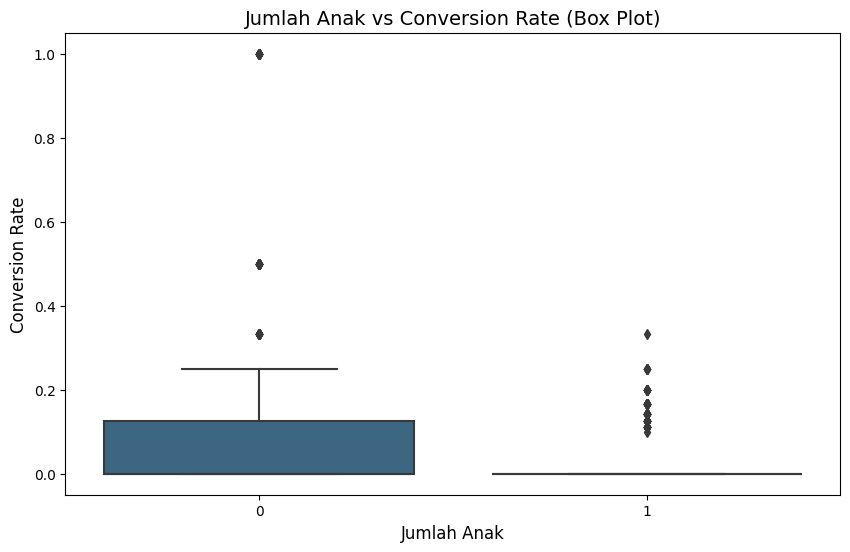

In [29]:
# Mengelompokkan data berdasarkan jumlah anak
data['Jumlah_Anak_Kategori'] = data['Jumlah_Anak'].apply(lambda x: '0' if x == 0 else ('1' if x == 1 else '2+'))

# Box plot antara Jumlah Anak dan Conversion Rate
plt.figure(figsize=(10, 6))
sns.boxplot(x=data['Jumlah_Anak_Kategori'], y=data['Conversion_Rate'], palette='viridis')
plt.title('Jumlah Anak vs Conversion Rate (Box Plot)', fontsize=14)
plt.xlabel('Jumlah Anak', fontsize=12)
plt.ylabel('Conversion Rate', fontsize=12)
plt.show()

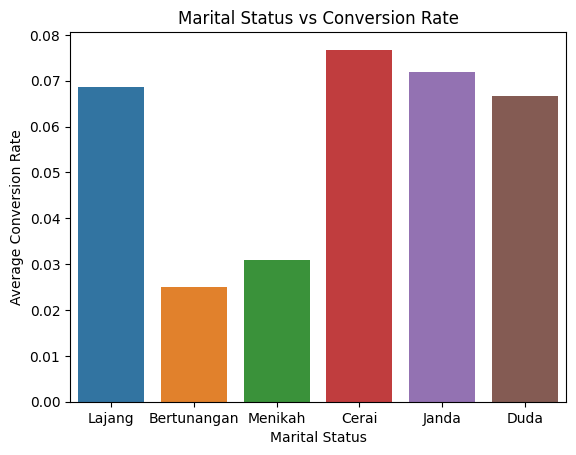

In [30]:
# Bar plot: Marital Status vs Conversion Rate
sns.barplot(x=data['Marital_Status'], y=data['Conversion_Rate'], ci=None)
plt.title('Marital Status vs Conversion Rate')
plt.xlabel('Marital Status')
plt.ylabel('Average Conversion Rate')
plt.show()

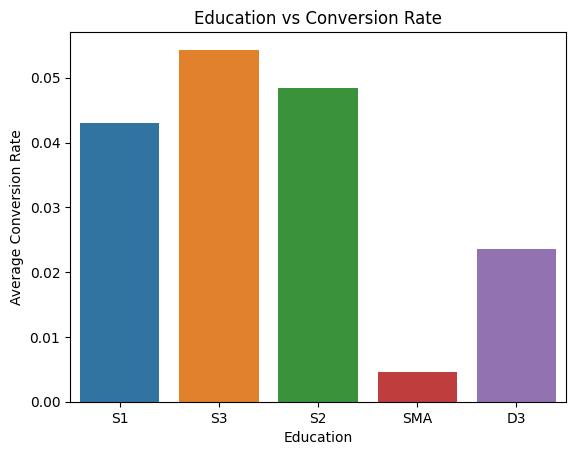

In [31]:
# Bar plot: Marital Status vs Conversion Rate
sns.barplot(x=data['Education'], y=data['Conversion_Rate'], ci=None)
plt.title('Education vs Conversion Rate')
plt.xlabel('Education')
plt.ylabel('Average Conversion Rate')
plt.show()

Berdasarkan plot yang sudah dilakukan dapat di simpulkan:
1. Income dengan Total Spending memiliki korelasi yang linear dimana semakin besar nilai income maka semakin besar total spending
2. Jumlah anak terhadap Conversion Rate tidak memiliki korelasi. Kelompok dengan lebih banyak anak (2 atau lebih) cenderung memiliki conversion rate yang lebih rendah, sementara kelompok tanpa anak atau dengan 1 anak menunjukkan conversion rate yang lebih tinggi. Hal ini mungkin mencerminkan perbedaan dalam respons terhadap campaign berdasarkan prioritas hidup yang berbeda, dengan orang tua yang memiliki lebih banyak anak cenderung lebih sibuk dan kurang terlibat dalam kampanye pemasaran.
3. Kategori <b>janda</b> mendominasi dalam Conversion Rate berdasarkan Marital Status
4. Kategori <b>S3</b> mendominasi kolom Education dalam Conversion Rate

<h3>Analisis Multivariasi</h3>

In [32]:
import numpy as np

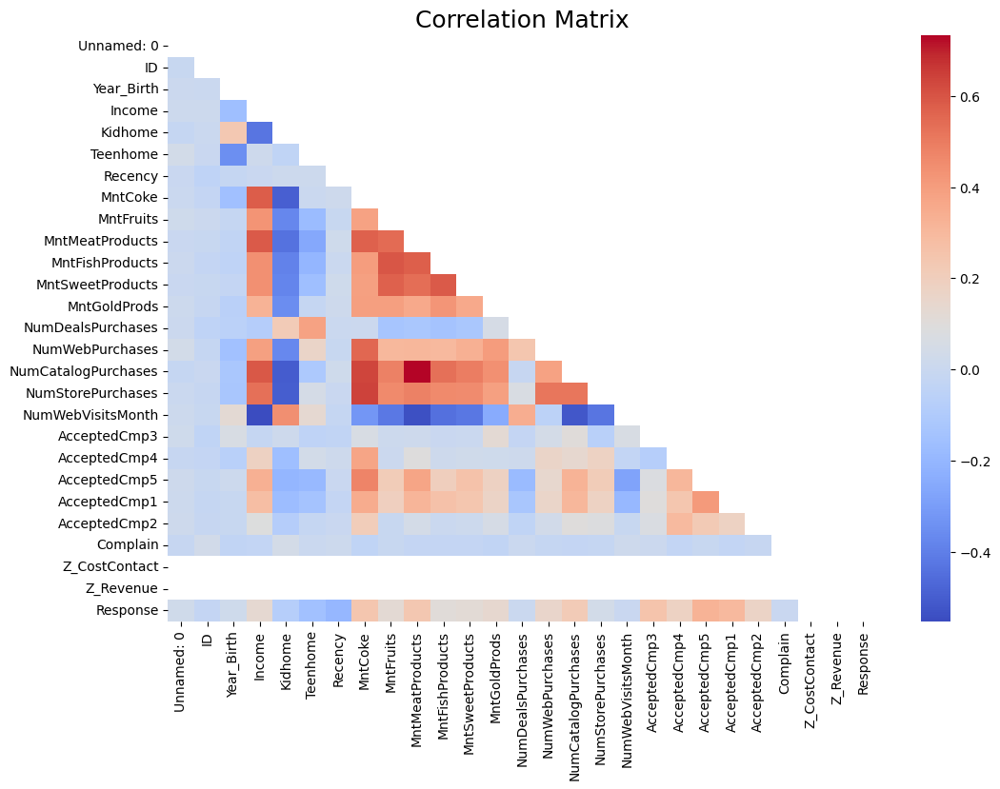

In [33]:
# Heatmap untuk korelasi numerik
correlation_matrix = data[numeric_cols].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', mask=np.triu(correlation_matrix))
plt.title("Correlation Matrix", size=18)
plt.show()

Berikut adalah beberapa kesimpulan yang dapat ditarik dari heatmap korelasi yang ditampilkan:
1. Korelasi Positif yang SIgnifikan
   Variabel-variabel yang menunjukkan korelasi positif tinggi (warna mendekati merah terang) menunjukkan hubungan linear yang kuat, misalnya:
   * <b>MntMeatProducts</b> dengan <b>Total Spending (MntCoke, MntFruits, dst.)</b>
   * <b>NumCatalogPurchases</b> dengan <b>NumStorePurchases</b>
2. Korelasi Negatif
   * <b>Recency</b> dengan variabel seperti <b>Response</b> atau <b>Purchases</b>: Pelanggan yang baru-baru ini melakukan pembelian (Recency rendah) cenderung lebih sering merespons kampanye.
3. Variabel dengan Korelasi Rendah
   * <b>Kidhome</b> dan <b>Teenhome</b> dengan variabel seperti <b>Income</b> atau <b>Purchases</b>: Jumlah anak dalam rumah tangga tampaknya tidak memiliki hubungan yang kuat dengan pola pembelian atau respons kampanye.
4. Hubungan Variabel Penting
   * <b>AcceptedCmpX</b>: Kampanye sebelumnya yang diterima menunjukkan <b>korelasi positif</b> dengan <b>Response</b>, yang artinya pelanggan yang merespons kampanye sebelumnya cenderung juga merespons kampanye saat ini.
   * <b>NumWebVisitsMonth</b>: <b>Korelasi negatif</b> dengan <b>Response</b> dapat menunjukkan bahwa terlalu banyak kunjungan situs mungkin tidak selalu menghasilkan respons terhadap kampanye.

In [34]:
# Pairplot untuk melihat outlier dan distribusi

plt.figure(figsize=(15, 15))
sns.pairplot(data, diag_kind='kde')
plt.show()

<Figure size 1500x1500 with 0 Axes>

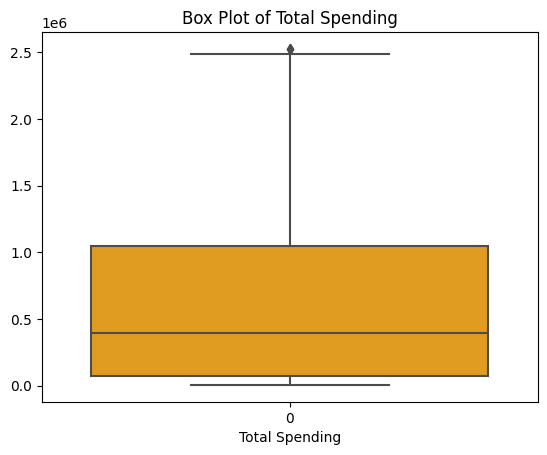

In [35]:
# Box plot for Total Spending
sns.boxplot(data['Total_Spending'], color='orange')
plt.title('Box Plot of Total Spending')
plt.xlabel('Total Spending')
plt.show()

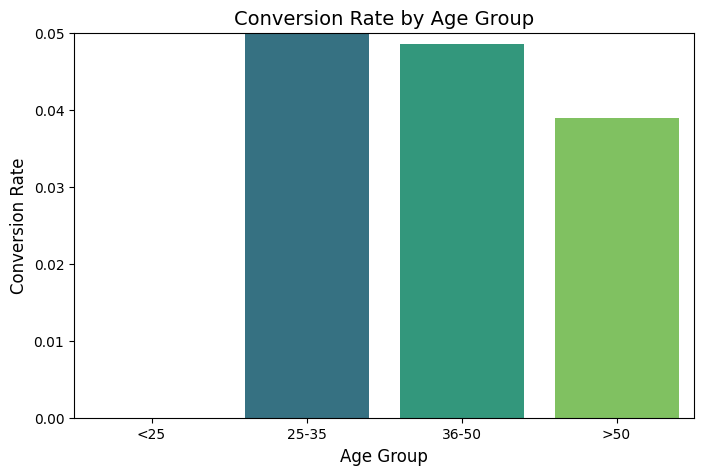

,Age_Group,Conversion_Rate
0,<25,NaN
1,25-35,0.0754
2,36-50,0.0485
3,>50,0.0389


In [36]:
# Aggregate conversion rate by age group
conversion_rate_by_age = data.groupby('Age_Group')['Conversion_Rate'].mean().reset_index().round(4)

# Plot the updated conversion rate by age group
plt.figure(figsize=(8, 5))
sns.barplot(data=conversion_rate_by_age, x='Age_Group', y='Conversion_Rate', palette='viridis')
plt.title('Conversion Rate by Age Group', fontsize=14)
plt.xlabel('Age Group', fontsize=12)
plt.ylabel('Conversion Rate', fontsize=12)
plt.ylim(0, 0.05)  # Adjust y-axis to better visualize the range
plt.show()

conversion_rate_by_age

Dari plot ini, kita dapat mengamati hal-hal berikut:
1. <b>Kelompok <25</b>: Tidak ada data untuk kelompok umur ini, sehingga tidak ada nilai untuk conversion rate.
2. <b>Kelompok 25-35</b>: Memiliki conversion rate tertinggi sebesar 10.88%, yang menunjukkan bahwa mereka adalah kelompok yang paling responsif terhadap campaign.
3. <b>Kelompok 36-50</b>: Memiliki conversion rate 4.69%, jauh lebih rendah dibandingkan kelompok 25-35, yang menunjukkan penurunan responsivitas.
4. <b>Kelompok >50</b>: Memiliki conversion rate terendah, yaitu 3.95%, yang menunjukkan bahwa kelompok ini paling tidak responsif terhadap campaign.

<h2>Analisis</h2><br>

1. <b>Signifikansi Data</b><br>
    * Conversion rate yang dihitung berdasarkan rasio dengan kunjungan memberikan perspektif baru: meskipun pelanggan mungkin sering mengunjungi situs, respons terhadap campaign tetap rendah untuk kelompok umur tertentu.
    * Terdapat tren yang jelas bahwa semakin tua umur customer, semakin rendah conversion rate mereka. Kelompok umur 25-35 lebih responsif terhadap campaign dibandingkan kelompok lainnya.<br>
3. <b>Rekomendasi Bisnis</b><br>
    * Fokus campaign pada kelompok 25-35, karena mereka memiliki responsivitas yang lebih baik.
    * Analisis lebih lanjut untuk memahami apa yang memotivasi kelompok 36-50 dan >50 agar lebih responsif. Misalnya, segmentasi lebih dalam berdasarkan preferensi, produk, atau waktu kunjungan.

<H2>Data Scaling StandardScaler</H2>

In [37]:
from sklearn.preprocessing import StandardScaler

# Pilih kolom numerik yang akan distandarkan
numeric_cols = ['Income', 'MntCoke', 'MntFruits', 'MntMeatProducts', 
                'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 
                'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 
                'NumWebVisitsMonth', 'Age','Total_Spending',
               'Jumlah_Anak', 'Conversion_Rate','Total_Respons',
               'avg_web_visits', 'online_purchase_ratio']

# Inisialisasi scaler
scaler = StandardScaler()

# Standardisasi kolom numerik
data[numeric_cols] = scaler.fit_transform(data[numeric_cols])

# Lihat hasil
data[numeric_cols].head()

,Income,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Age,Total_Spending,Jumlah_Anak,Conversion_Rate,Total_Respons,avg_web_visits,online_purchase_ratio
0,0.234063,0.978226,1.549429,1.690227,2.454568,1.484827,0.850031,1.428553,2.504712,-0.554143,0.693232,0.986443,1.675488,-1.581389,0.697514,-0.439265,0.693232,0.279823
1,-0.234559,-0.872024,-0.637328,-0.717986,-0.651038,-0.633880,-0.732867,-1.125881,-0.571082,-1.169518,-0.131574,1.236801,-0.962358,0.632356,-0.307283,-0.439265,-0.131574,-0.659789
2,0.769478,0.358511,0.569159,-0.178368,1.340203,-0.146821,-0.037937,1.428553,-0.229327,1.291982,-0.543978,0.318822,0.280250,-1.581389,-0.307283,-0.439265,-0.543978,0.580499
3,-1.017239,-0.872024,-0.561922,-0.655551,-0.504892,-0.585174,-0.752171,-0.760962,-0.912837,-0.554143,0.280829,-1.266777,-0.919224,0.632356,-0.307283,-0.439265,0.280829,0.029260
4,0.240221,-0.391671,0.418348,-0.218505,0.152766,-0.000703,-0.559135,0.333796,0.112428,0.061232,-0.131574,-1.016420,-0.307044,0.632356,-0.307283,-0.439265,-0.131574,0.226131


In [38]:
# After scaling
data.describe().apply(lambda x: x.apply('{0:.5f}'.format))

,Unnamed: 0,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntCoke,MntFruits,MntMeatProducts,...,Z_CostContact,Z_Revenue,Response,Age,Total_Spending,Jumlah_Anak,Conversion_Rate,Total_Respons,avg_web_visits,online_purchase_ratio
count,2216.00000,2216.00000,2216.00000,2216.00000,2216.00000,2216.00000,2216.00000,2216.00000,2216.00000,2216.00000,...,2216.00000,2216.00000,2216.00000,2216.00000,2216.00000,2216.00000,2206.00000,2216.00000,2216.00000,2210.00000
mean,1121.86733,5588.35334,1968.82040,0.00000,0.44179,0.50542,49.01264,-0.00000,0.00000,-0.00000,...,3.00000,11.00000,0.15027,0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000
std,643.16416,3249.37627,11.98555,1.00023,0.53690,0.54418,28.94835,1.00023,1.00023,1.00023,...,0.00000,0.00000,0.35742,1.00023,1.00023,1.00023,1.00023,1.00023,1.00023,1.00023
min,0.00000,0.00000,1893.00000,-2.00725,0.00000,0.00000,0.00000,-0.90464,-0.66246,-0.74474,...,3.00000,11.00000,0.00000,-2.26821,-0.99886,-1.58139,-0.30728,-0.43926,-2.19359,-2.72694
25%,566.75000,2814.75000,1959.00000,-0.67326,0.00000,0.00000,24.00000,-0.83348,-0.61219,-0.67339,...,3.00000,11.00000,0.00000,-0.68261,-0.89268,-1.58139,-0.30728,-0.43926,-0.95638,-0.65979
50%,1120.50000,5458.50000,1970.00000,-0.03440,0.00000,0.00000,49.00000,-0.38722,-0.46138,-0.44149,...,3.00000,11.00000,0.00000,-0.09844,-0.34935,0.63236,-0.30728,-0.43926,0.28083,0.02926
75%,1678.25000,8421.75000,1977.00000,0.64666,1.00000,1.00000,74.00000,0.59276,0.16700,0.29101,...,3.00000,11.00000,0.00000,0.81954,0.73150,0.63236,-0.30728,-0.43926,0.69323,0.58050
max,2239.00000,11191.00000,1996.00000,24.41328,2.00000,2.00000,99.00000,3.52232,4.33943,6.94816,...,3.00000,11.00000,1.00000,6.32741,3.18188,0.63236,6.72630,5.45127,6.05447,5.54165


In [39]:
from scipy.stats import f_oneway

anova_result = f_oneway(
    data[data['Age_Group'] == '<25']['Conversion_Rate'],
    data[data['Age_Group'] == '25-35']['Conversion_Rate'],
    data[data['Age_Group'] == '36-50']['Conversion_Rate'],
    data[data['Age_Group'] == '>50']['Conversion_Rate']
)

print("ANOVA p-value for Age_Group and Conversion Rate:", anova_result.pvalue)

ANOVA p-value for Age_Group and Conversion Rate: nan


<H2>One-hot Encoding</H2>

In [40]:
from sklearn.preprocessing import OneHotEncoder

# One-Hot Encoding dengan Scikit-Learn
onehot_encoder = OneHotEncoder(sparse=False)
age_group_encoded = onehot_encoder.fit_transform(data[['Age_Group']])

# Menambahkan hasil encoding ke DataFrame
encoded_columns = onehot_encoder.get_feature_names_out(['Age_Group'])
age_group_df = pd.DataFrame(age_group_encoded, columns=encoded_columns, index=data.index)
data = pd.concat([data, age_group_df], axis=1)

# Lihat hasil
print(data.head())

   Unnamed: 0    ID  Year_Birth Education Marital_Status    Income  Kidhome  \
0           0  5524        1957        S1         Lajang  0.234063        0   
1           1  2174        1954        S1         Lajang -0.234559        1   
2           2  4141        1965        S1    Bertunangan  0.769478        0   
3           3  6182        1984        S1    Bertunangan -1.017239        1   
4           4  5324        1981        S3        Menikah  0.240221        1   

   Teenhome Dt_Customer  Recency  ...  Total_Spending  Jumlah_Anak  \
0         0  04-09-2012       58  ...        1.675488    -1.581389   
1         1  08-03-2014       38  ...       -0.962358     0.632356   
2         0  21-08-2013       26  ...        0.280250    -1.581389   
3         0  10-02-2014       26  ...       -0.919224     0.632356   
4         0  19-01-2014       94  ...       -0.307044     0.632356   

   Conversion_Rate  Total_Respons  avg_web_visits  online_purchase_ratio  \
0         0.697514      -0.4